In [4]:
import audiofile as af
import numpy as np
import matplotlib.pyplot as plt

In [15]:
def wada_snr(wav):
    # Direct blind estimation of the SNR of a speech signal.
    #
    # Paper on WADA SNR:
    #   http://www.cs.cmu.edu/~robust/Papers/KimSternIS08.pdf
    #
    # This function was adapted from this matlab code:
    #   https://labrosa.ee.columbia.edu/projects/snreval/#9

    # init
    eps = 1e-10
    # next 2 lines define a fancy curve derived from a gamma distribution -- see paper
    db_vals = np.arange(-20, 101)
    g_vals = np.array([0.40974774, 0.40986926, 0.40998566, 0.40969089, 0.40986186, 0.40999006, 0.41027138, 0.41052627, 0.41101024, 0.41143264, 0.41231718, 0.41337272, 0.41526426, 0.4178192 , 0.42077252, 0.42452799, 0.42918886, 0.43510373, 0.44234195, 0.45161485, 0.46221153, 0.47491647, 0.48883809, 0.50509236, 0.52353709, 0.54372088, 0.56532427, 0.58847532, 0.61346212, 0.63954496, 0.66750818, 0.69583724, 0.72454762, 0.75414799, 0.78323148, 0.81240985, 0.84219775, 0.87166406, 0.90030504, 0.92880418, 0.95655449, 0.9835349 , 1.01047155, 1.0362095 , 1.06136425, 1.08579312, 1.1094819 , 1.13277995, 1.15472826, 1.17627308, 1.19703503, 1.21671694, 1.23535898, 1.25364313, 1.27103891, 1.28718029, 1.30302865, 1.31839527, 1.33294817, 1.34700935, 1.3605727 , 1.37345513, 1.38577122, 1.39733504, 1.40856397, 1.41959619, 1.42983624, 1.43958467, 1.44902176, 1.45804831, 1.46669568, 1.47486938, 1.48269965, 1.49034339, 1.49748214, 1.50435106, 1.51076426, 1.51698915, 1.5229097 , 1.528578  , 1.53389835, 1.5391211 , 1.5439065 , 1.54858517, 1.55310776, 1.55744391, 1.56164927, 1.56566348, 1.56938671, 1.57307767, 1.57654764, 1.57980083, 1.58304129, 1.58602496, 1.58880681, 1.59162477, 1.5941969 , 1.59693155, 1.599446  , 1.60185011, 1.60408668, 1.60627134, 1.60826199, 1.61004547, 1.61192472, 1.61369656, 1.61534074, 1.61688905, 1.61838916, 1.61985374, 1.62135878, 1.62268119, 1.62390423, 1.62513143, 1.62632463, 1.6274027 , 1.62842767, 1.62945532, 1.6303307 , 1.63128026, 1.63204102])

    # peak normalize, get magnitude, clip lower bound
    wav = np.array(wav)
    wav = wav / abs(wav).max()
    abs_wav = abs(wav)
    abs_wav[abs_wav < eps] = eps

    # calcuate statistics
    # E[|z|]
    v1 = max(eps, abs_wav.mean())
    # E[log|z|]
    v2 = np.log(abs_wav).mean()
    # log(E[|z|]) - E[log(|z|)]
    v3 = np.log(v1) - v2

    # table interpolation
    wav_snr_idx = None
    if any(g_vals < v3):
        wav_snr_idx = np.where(g_vals < v3)[0].max()
    # handle edge cases or interpolate
    if wav_snr_idx is None:
        wav_snr = db_vals[0]
    elif wav_snr_idx == len(db_vals) - 1:
        wav_snr = db_vals[-1]
    else:
        wav_snr = db_vals[wav_snr_idx] + \
            (v3-g_vals[wav_snr_idx]) / (g_vals[wav_snr_idx+1] - \
            g_vals[wav_snr_idx]) * (db_vals[wav_snr_idx+1] - db_vals[wav_snr_idx])

    # Calculate SNR
    dEng = sum(wav**2)
    dFactor = 10**(wav_snr / 10)
    dNoiseEng = dEng / (1 + dFactor) # Noise energy
    dSigEng = dEng * dFactor / (1 + dFactor) # Signal energy
    snr = 10 * np.log10(dSigEng / dNoiseEng)

    return snr

c:\users\pedro\miniconda3\envs\dev_pedro\lib\site-packages\numpy\core\_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


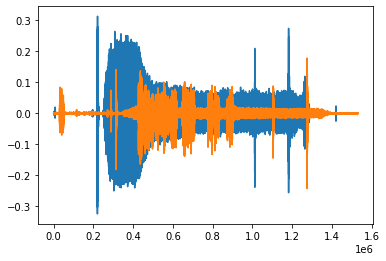

In [6]:
noise,sr = np.mean(af.read('noise.wav'),axis=0) - 24000
speech,sr = np.mean(af.read('speech.wav'),axis=0) - 24000
plt.plot(noise)
plt.plot(speech)

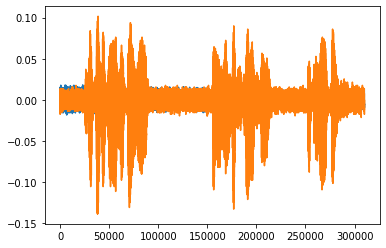

In [7]:
shift = 90969
start = 620000
hop=310000
norm_factor = 5.5
plt.plot(np.pad(noise,(shift,0))[start:start+hop]/norm_factor)
plt.plot(np.pad(speech,(0,0))[start:start+hop])

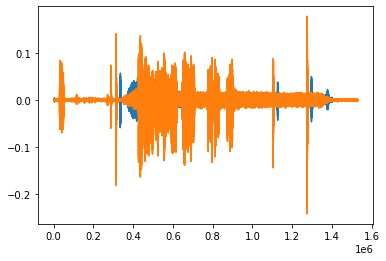

In [9]:

plt.plot(np.roll(np.pad(noise,(shift,0))/norm_factor,24000))
plt.plot(np.pad(speech,(0,0)))

In [10]:
aligned_noise = np.pad(noise,(shift,0))[start:start+hop]/norm_factor
aligned_speech = np.pad(speech,(0,0))[start:start+hop]

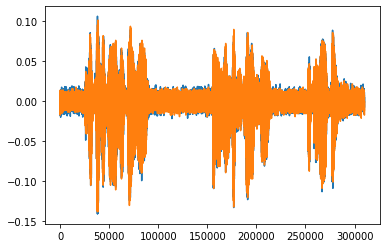

In [11]:
plt.plot(aligned_speech - aligned_noise)
plt.plot(aligned_speech)

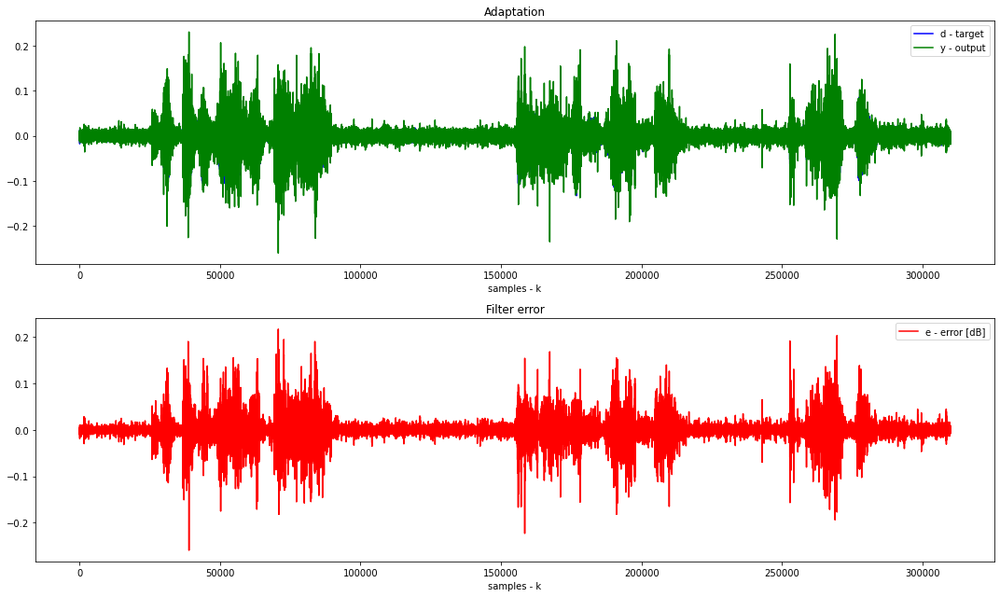

snr_orig:[ 0.00976562  0.00976562  0.00976562 ... -0.015625   -0.01367188
 -0.01171875]
snr_after:[0.0034347  0.00304731 0.0001804  ... 0.0007815  0.00168212 0.00364811]


In [17]:
import padasip as pa

n = 10
d=aligned_speech
delay=0
x = pa.input_from_history(aligned_noise,n)[:-1]
d = d[n:]
f=pa.filters.FilterRLS(mu=0.01, n=n,w='random')


y, e, w = f.run(d, x)
# show results
plt.figure(figsize=(15,9))
plt.subplot(211);plt.title("Adaptation");plt.xlabel("samples - k")
plt.plot(d,"b", label="d - target")
plt.plot(y,"g", label="y - output");plt.legend()
plt.subplot(212);plt.title("Filter error");plt.xlabel("samples - k")
plt.plot(e,"r", label="e - error [dB]");plt.legend()
plt.tight_layout()
plt.show()
print(f'snr_orig:{aligned_speech}\nsnr_after:{e}')

In [195]:
sr

48000

In [204]:
from tqdm import tqdm
d = aligned_speech
delay=3000
x = np.roll(aligned_noise,delay)
L = len(d)
M = 160
mu = 0.06
w=np.random.normal(0,mu,M)
y=np.zeros(L-M)
e=np.zeros(L-M)
for i in tqdm(range(M,L-M)):
    xPart = x[i-M:i]
    y[i-M]=xPart.dot(w)
    e[i-M]=d[i-M]-y[i-M]
    w = w+ mu*e[i-M]*xPart#/(x.T@x)
print(f'snr_orig:{wada_snr(aligned_speech -np.mean(aligned_speech))}\nsnr_after:{wada_snr(e)}')

    


100%|██████████████████████████████████████████████████████████████████████| 309680/309680 [00:02<00:00, 106058.59it/s]


snr_orig:31.211244286946144
snr_after:14.288327637886162


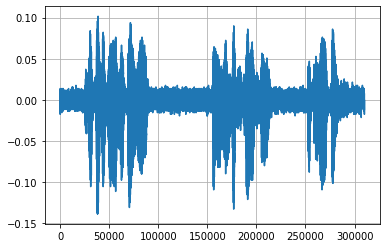

In [198]:
plt.plot(aligned_speech)
plt.grid(True)

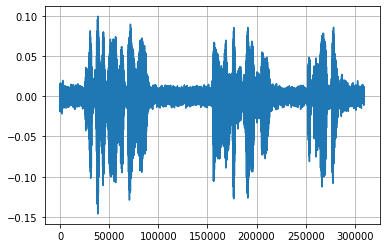

In [205]:
plt.plot(np.array(e))
plt.grid(True)
#plt.plot(aligned_speech)

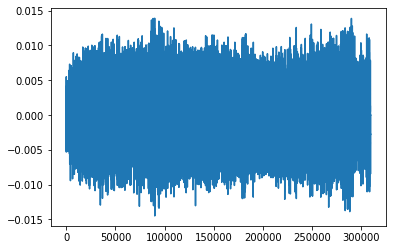

In [200]:
plt.plot(y)

In [201]:
ipd.Audio(aligned_speech,rate=48000)

In [75]:
import IPython.display as ipd
ipd.Audio(e,rate=48000)

In [206]:
d = e
delay=3000
x = np.roll(e,delay)
L = len(d)
M = 4
mu = 3e-2
w=np.zeros(M)
y=np.zeros(L-M)
e_new=np.zeros(L-M)
for i in tqdm(range(M,L-M)):
    xPart = x[i-M:i]
    y[i-M]=xPart.dot(w)
    e_new[i-M]=d[i-M]-y[i-M]
    w = w+ mu*e_new[i-M]*xPart#/(x.T@x)
print(f'snr_orig:{wada_snr(aligned_speech -np.mean(aligned_speech))}\nsnr_after:{wada_snr((y-np.mean(y))/np.max(y))}')

100%|██████████████████████████████████████████████████████████████████████| 309832/309832 [00:01<00:00, 212788.43it/s]


snr_orig:31.211244286946144
snr_after:100.0


In [85]:
wada_snr((y-np.mean(y)))

100.0

In [211]:
ipd.Audio(y,rate=48000)

Text(0, 0.5, 'Amplitude')

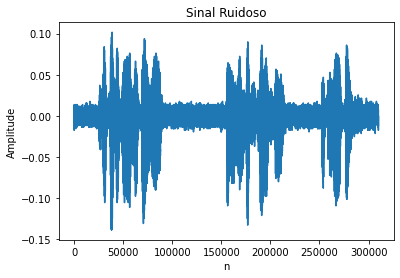

In [208]:
plt.plot(aligned_speech)
plt.title('Sinal Ruidoso')
plt.xlabel('n')
plt.ylabel('Amplitude')

Text(0, 0.5, 'Amplitude')

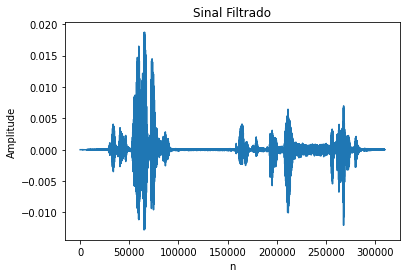

In [210]:
plt.plot(y)
plt.title('Sinal Filtrado')
plt.xlabel('n')
plt.ylabel('Amplitude')

In [196]:
sr

48000

In [1213]:
ipd.Audio(e_new,rate=48000)

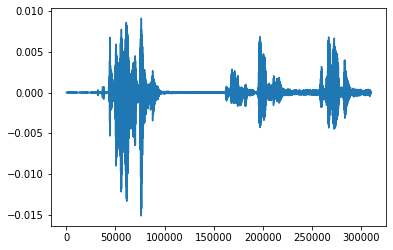

In [50]:
plt.plot(y)

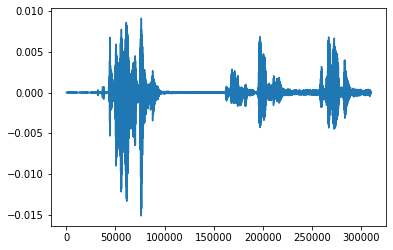

In [51]:
plt.plot(y)

In [52]:
ipd.Audio(aligned_speech,rate=48000)

c:\users\pedro\miniconda3\envs\dev_pedro\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


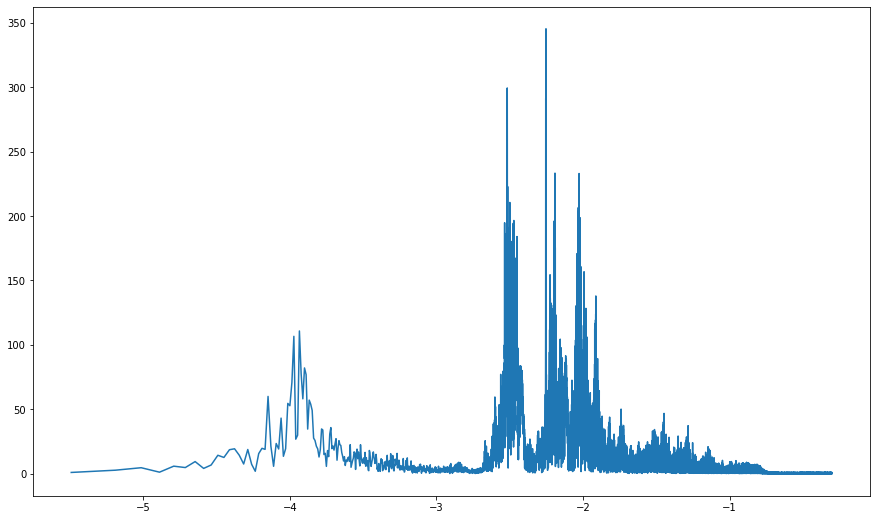

In [213]:
import scipy
plt.figure(figsize=(15,9))
N = len(aligned_speech)
speech_fft = scipy.fft.fft(aligned_speech)[:N//2]
freq = scipy.fft.fftfreq(aligned_speech.shape[-1])[:N//2]
plt.plot(np.log10(freq),np.abs(speech_fft))

c:\users\pedro\miniconda3\envs\dev_pedro\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log10
  """


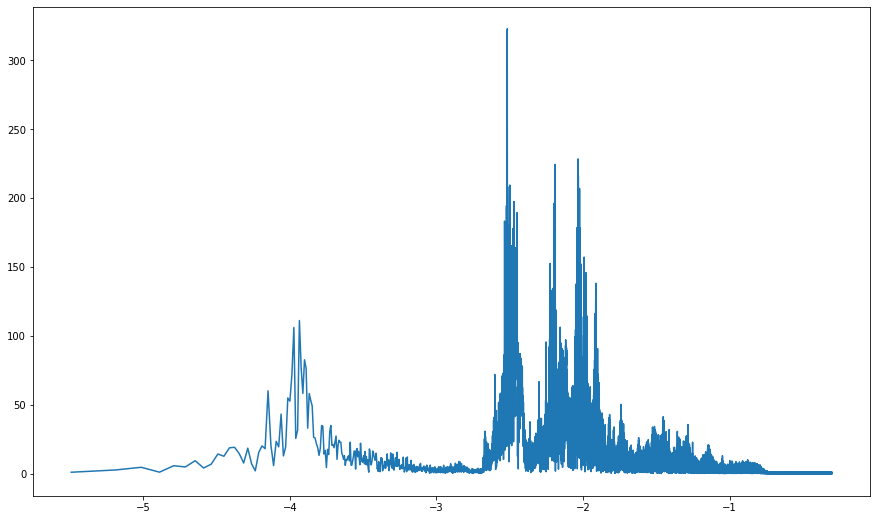

In [214]:
plt.figure(figsize=(15,9))
N = len(e)
e_fft = scipy.fft.fft(e)[:N//2]
freq = scipy.fft.fftfreq(e.shape[-1])[:N//2]
plt.plot(np.log10(freq),np.abs(e_fft))

In [105]:
ipd.Audio(speech,rate=48000)

In [669]:
speech3,sr = af.read('speech2.aac')
noise3,sr = af.read('noise2.aac')
speech3.shape,sr

((720896,), 22050)

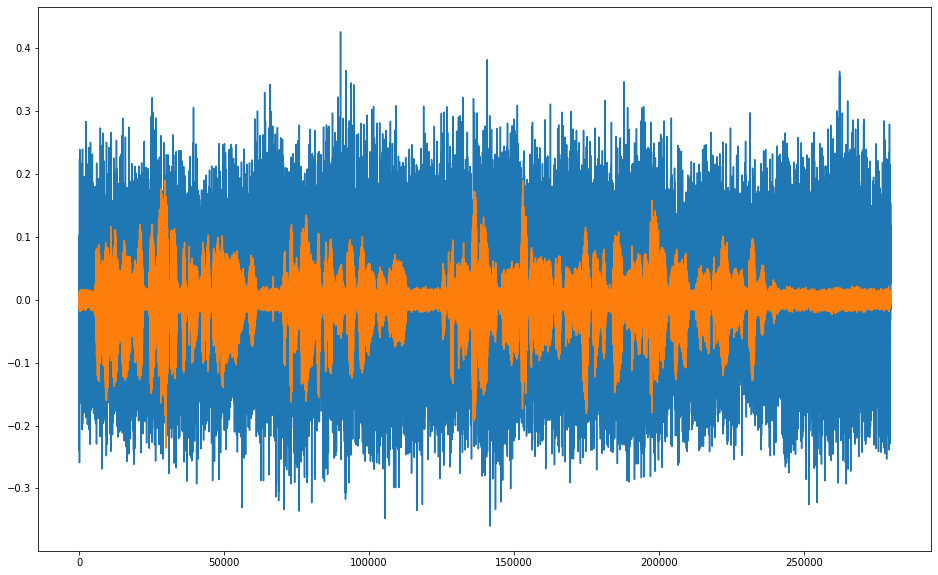

In [798]:

shift = 44238
start = 300000
hop= 280000
norm_factor = 1
plt.figure(figsize=(16,10))
plt.plot(np.pad(noise3,(shift,0))[start:start+hop]/norm_factor)
plt.plot(np.pad(speech3,(0,0))[start:start+hop])

In [799]:
aligned_noise3 = np.pad(noise3,(shift,0))[start:start+hop]/norm_factor
aligned_speech3 = np.pad(speech3,(0,0))[start:start+hop]

In [1093]:

d = aligned_speech3
delay=2560
x = np.roll(aligned_noise3,delay)
L = len(d)
M = 320
mu = 8.2e-2
w=np.random.normal(0,mu,M)
y=np.zeros(L-M)
e=np.zeros(L-M)
for i in tqdm(range(M,L-M)):
    xPart = x[i-M:i]
    y[i-M]=xPart.dot(w)
    e[i-M]=d[i-M]-y[i-M]
    w = w+ mu*e[i-M]*xPart#/(x.T@x)
print(f'smr_orig:{np.log10(np.sum(aligned_speech3**2/(aligned_noise3**2+1e-7)))}\nsmr_after:{np.log10(np.sum(e**2/(aligned_noise3[:(L-M)]**2+1e-7)))}')

100%|████████████████████████████████████████████████████████████████████████| 279360/279360 [00:10<00:00, 25839.34it/s]

smr_orig:6.946094989776611
smr_after:6.728959835737996


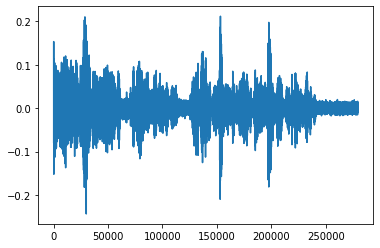

In [1094]:
plt.plot(e)
#plt.plot(aligned_speech3)

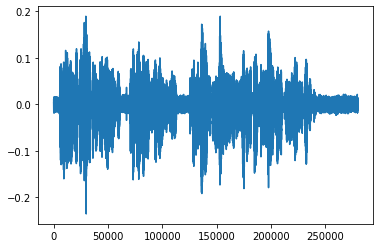

In [1095]:
plt.plot(aligned_speech3)

In [1088]:
ipd.Audio(e,rate=sr)

In [1010]:
ipd.Audio(aligned_speech3,rate=sr)

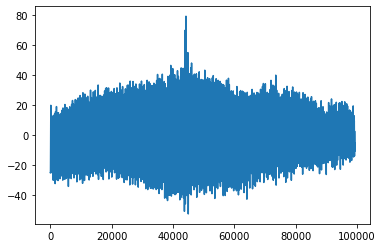

In [796]:
plt.plot(np.correlate(speech3,noise3))

In [901]:
np.argmax(np.correlate(speech,noise))

90969

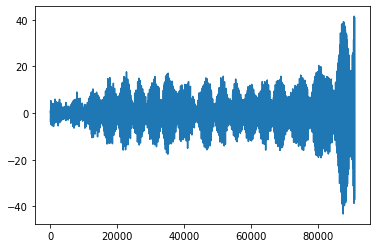

In [902]:
plt.plot(np.correlate(speech,noise))

In [1030]:
d = e
delay=2560
x = np.roll(e,delay)
L = len(d)
M = 128
mu = 1e-2
w=np.zeros(M)
y=np.zeros(L-M)
e_new=np.zeros(L-M)
for i in tqdm(range(M,L-M)):
    xPart = x[i-M:i]
    y[i-M]=xPart.dot(w)
    e_new[i-M]=d[i-M]-y[i-M]
    w = w+ mu*e_new[i-M]*xPart#/(x.T@x)

100%|████████████████████████████████████████████████████████████████████████| 279424/279424 [00:04<00:00, 66460.45it/s]


In [86]:
ipd.Audio(e_new,rate=48000)